<a href="https://colab.research.google.com/github/Shivaranjani1711/Cognifyz-Technology/blob/main/Location_based_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd

data = pd.read_csv("/content/Dataset .csv")
data.head()


,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


In [ ]:
data.info()
data.describe()
data.columns


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15  Switch to order menu 

Index(['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address',
       'Locality', 'Locality Verbose', 'Longitude', 'Latitude', 'Cuisines',
       'Average Cost for two', 'Currency', 'Has Table booking',
       'Has Online delivery', 'Is delivering now', 'Switch to order menu',
       'Price range', 'Aggregate rating', 'Rating color', 'Rating text',
       'Votes'],
      dtype='object')

In [ ]:
grouped_city = data.groupby('City').agg({
    'Restaurant Name': 'count',
    'Aggregate rating': 'mean',
    'Price range': 'mean'
}).rename(columns={
    'Restaurant Name': 'Restaurant Count',
    'Aggregate rating': 'Avg Rating',
    'Price range': 'Avg Price Range'
}).sort_values(by='Restaurant Count', ascending=False)

grouped_city.head(10)


,Restaurant Count,Avg Rating,Avg Price Range
City,,,
New Delhi,5473,2.438845,1.621597
Gurgaon,1118,2.651431,1.855993
Noida,1080,2.036204,1.601852
Faridabad,251,1.866932,1.454183
Ghaziabad,25,2.852000,1.800000
Bhubaneshwar,21,3.980952,1.857143
Lucknow,21,4.195238,2.571429
Guwahati,21,4.190476,2.523810
Ahmedabad,21,4.161905,2.571429


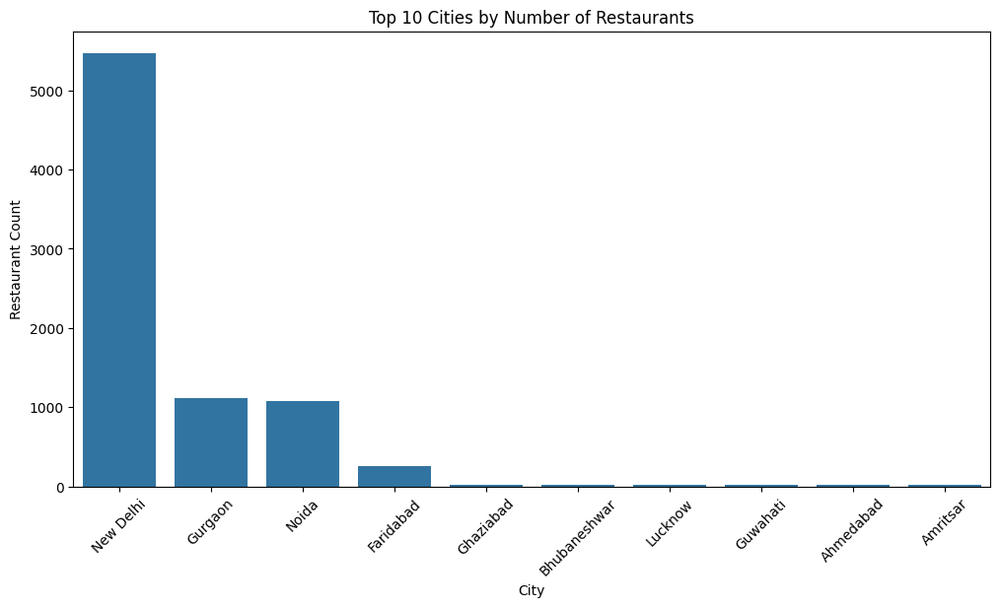

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

top_cities = grouped_city.head(10).reset_index()

plt.figure(figsize=(12,6))
sns.barplot(x='City', y='Restaurant Count', data=top_cities)
plt.title("Top 10 Cities by Number of Restaurants")
plt.xticks(rotation=45)
plt.show()


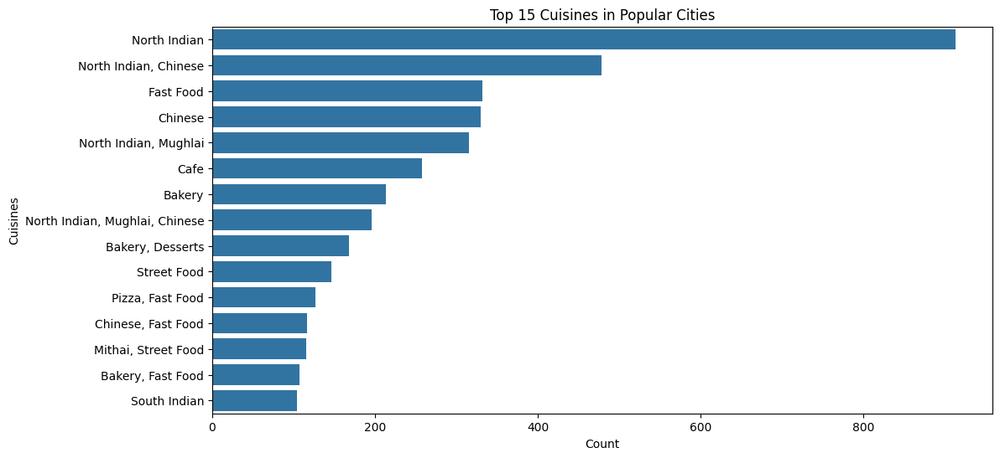

In [ ]:
top_cities_list = top_cities['City'].tolist()
filtered_df = data[data['City'].isin(top_cities_list)]

cuisine_count = filtered_df['Cuisines'].value_counts().head(15)

plt.figure(figsize=(12,6))
sns.barplot(y=cuisine_count.index, x=cuisine_count.values)
plt.title("Top 15 Cuisines in Popular Cities")
plt.xlabel("Count")
plt.ylabel("Cuisines")
plt.show()


In [ ]:
!pip install folium

import pandas as pd
import folium
from folium.plugins import MarkerCluster


data= data.dropna(subset=['Latitude', 'Longitude'])

map_center = [data['Latitude'].mean(), data['Longitude'].mean()]
restaurant_map = folium.Map(location=map_center, zoom_start=10, tiles='OpenStreetMap')

marker_cluster = MarkerCluster().add_to(restaurant_map)

for _, row in data.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=(
            f"<b>{row.get('Restaurant Name', 'N/A')}</b><br>"
            f"City: {row.get('City', 'N/A')}<br>"
            f"Locality: {row.get('Locality', 'N/A')}<br>"
            f"Rating: {row.get('Aggregate rating', 'N/A')}<br>"
            f"Cuisines: {row.get('Cuisines', 'N/A')}"
        ),
        tooltip=row.get('Restaurant Name', 'Restaurant')
    ).add_to(marker_cluster)

restaurant_map
